In [1]:
import tensorflow as tf
import sys

sys.path.append('../')

from Afterthought.Objective import Objective
from Afterthought.Parameterization import *
from Afterthought.Transformation import *
from Afterthought.Regularizer import *
from Afterthought.Optimizer import *
from Afterthought.Miscellaneous import *
from Afterthought.Attribution import *
from Afterthought.Wrapper import *

print(tf.__version__)
print(tf.config.list_physical_devices('GPU'))

2.10.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# Model selection

In [2]:
# Model names: https://keras.io/api/applications/

model = Wrapper(model = 'InceptionV3')

print(model.layers())

['input_1', 'conv2d', 'batch_normalization', 'activation', 'conv2d_1', 'batch_normalization_1', 'activation_1', 'conv2d_2', 'batch_normalization_2', 'activation_2', 'max_pooling2d', 'conv2d_3', 'batch_normalization_3', 'activation_3', 'conv2d_4', 'batch_normalization_4', 'activation_4', 'max_pooling2d_1', 'conv2d_8', 'batch_normalization_8', 'activation_8', 'conv2d_6', 'conv2d_9', 'batch_normalization_6', 'batch_normalization_9', 'activation_6', 'activation_9', 'average_pooling2d', 'conv2d_5', 'conv2d_7', 'conv2d_10', 'conv2d_11', 'batch_normalization_5', 'batch_normalization_7', 'batch_normalization_10', 'batch_normalization_11', 'activation_5', 'activation_7', 'activation_10', 'activation_11', 'mixed0', 'conv2d_15', 'batch_normalization_15', 'activation_15', 'conv2d_13', 'conv2d_16', 'batch_normalization_13', 'batch_normalization_16', 'activation_13', 'activation_16', 'average_pooling2d_1', 'conv2d_12', 'conv2d_14', 'conv2d_17', 'conv2d_18', 'batch_normalization_12', 'batch_normaliza

# Normal Noise

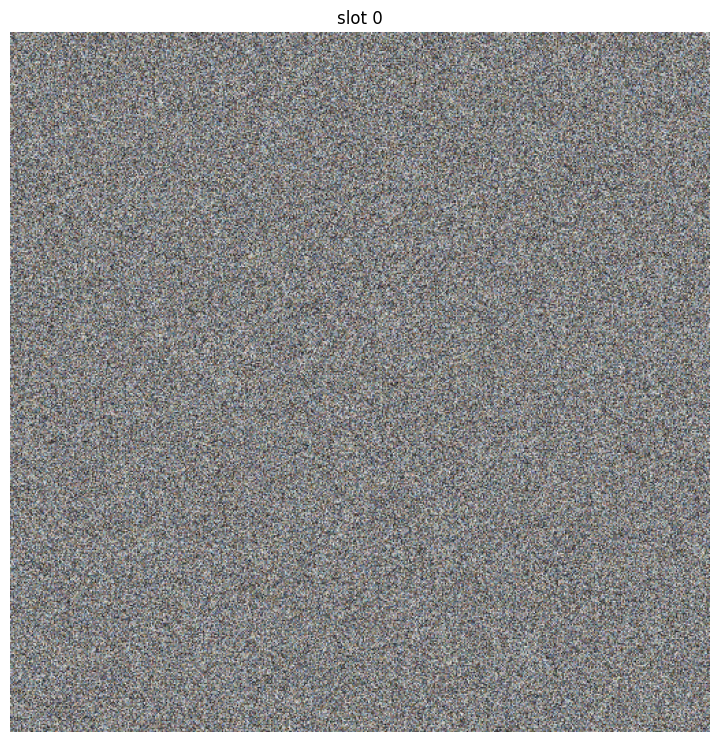

In [6]:
parameterization = Parameterization.image_normal(512)

# Activation maximization initial image
image = parameterization.images 

# Function that transform the image each step of the activation maximization 
function = parameterization.function[0]

plot_all(function(image))

### Activation maximization

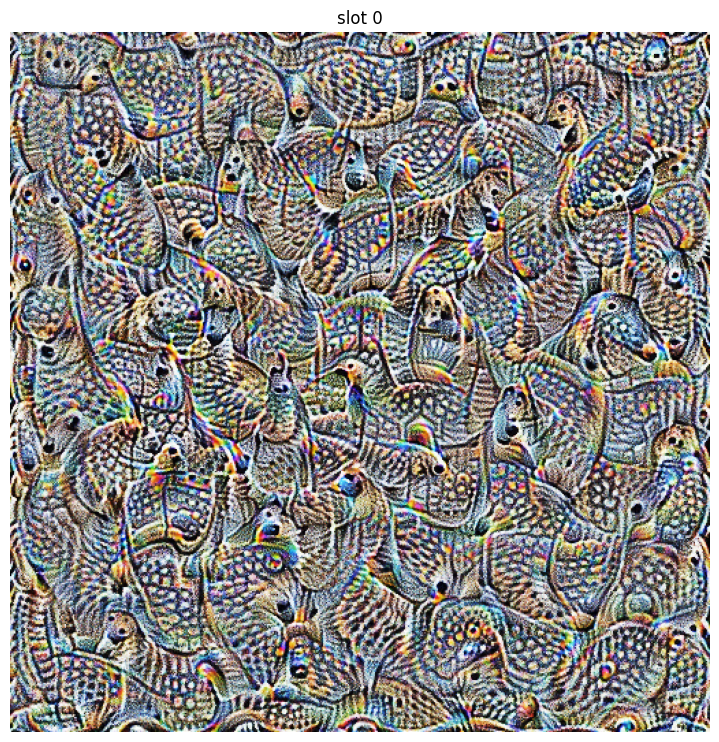

In [4]:
# Layer name
layer = 'conv_pw_12'

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, learning_rate = 0.1)

plot_all(images)

# CPPN

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


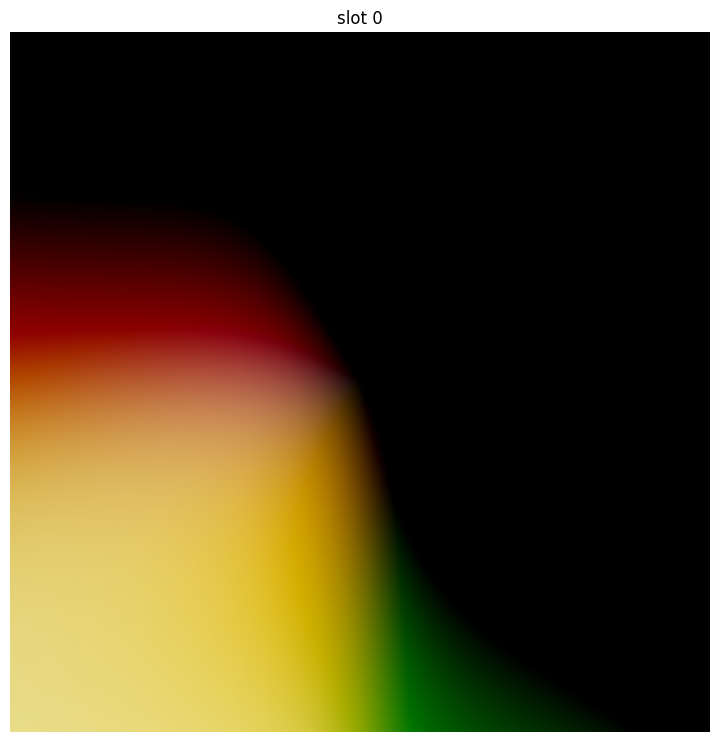

In [5]:
num_hidden_channels = 6
num_layers = 2

parameterization = Parameterization.image_cppn(512,
                                               num_hidden_channels = num_hidden_channels,
                                               num_layers = num_layers,
                                               activation_func = tf.tanh)

# Activation maximization initial image
image = parameterization.images 

plot_all(image)

### Activation maximization

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


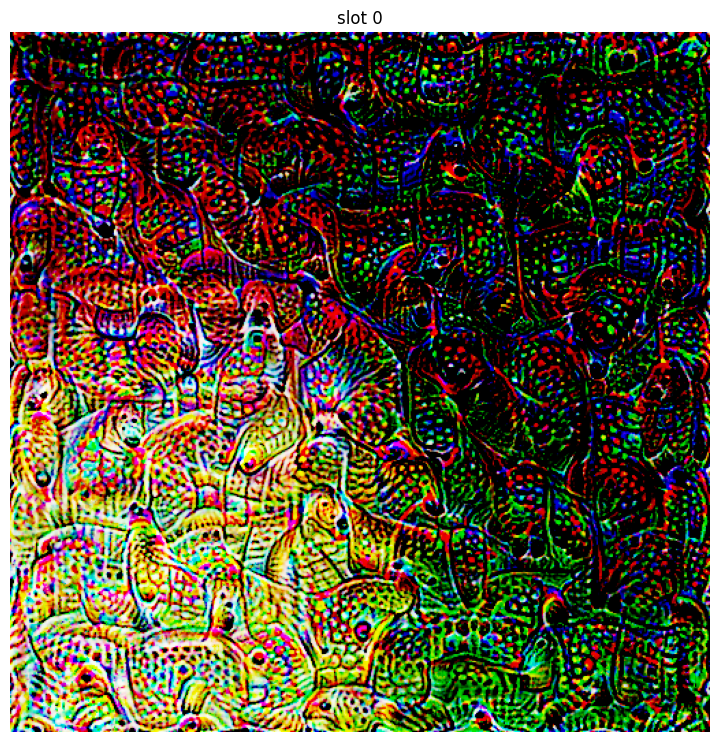

In [6]:
# Layer name
layer = 'conv_pw_12'

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, 
             learning_rate = 0.05) # lower learning rate its better for this parameterization

plot_all(images)

# Fast Fourier Transform

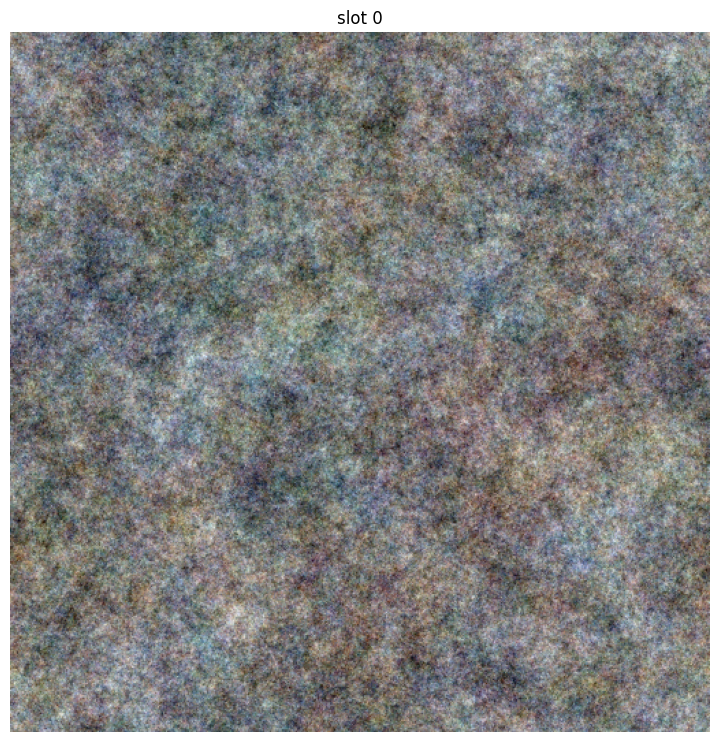

In [13]:
fft_decay = 0.85

parameterization = Parameterization.image_fft(512, fft_decay = fft_decay)

# Activation maximization initial image
image = parameterization.images

fft_scale = get_fft_scale(512, 512, decay_power = fft_decay)

# Function that transform the image each step of the activation maximization 
function = parameterization.function[0]

plot_all([function(image[0])])

### Activation maximization

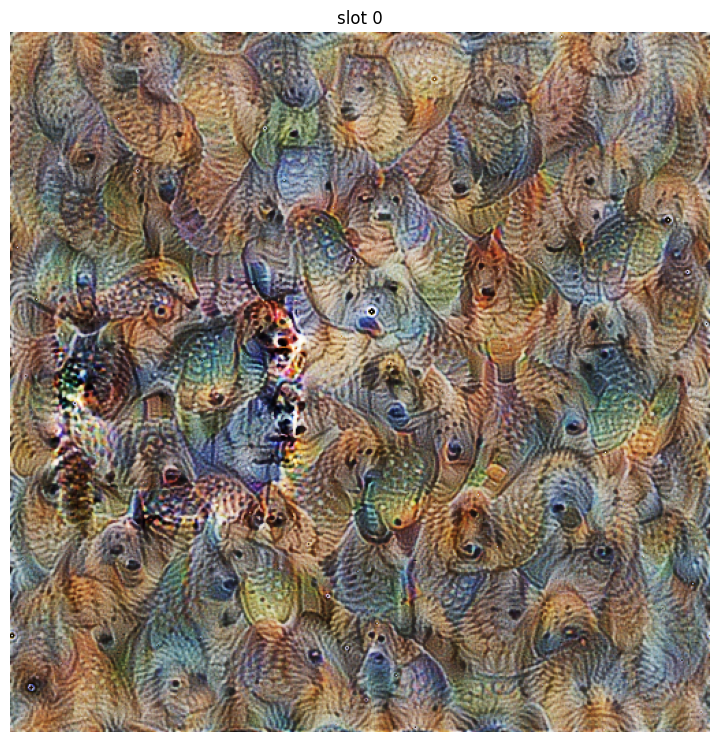

In [14]:
# Layer name
layer = 'conv_pw_12'

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, 
             learning_rate = 0.1)

plot_all(images)

# Laplacian_pyramid

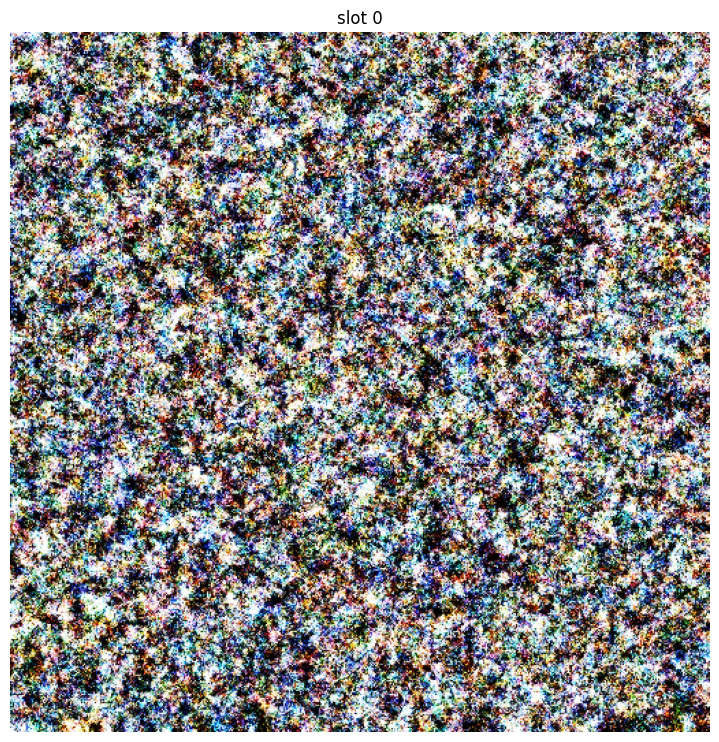

In [4]:
levels = 4

parameterization = Parameterization.image_laplacian_pyramid(512, levels = levels)

# Activation maximization initial image
image = parameterization.images 

plot_all(parameterization.function[0](image))

### Activation maximization

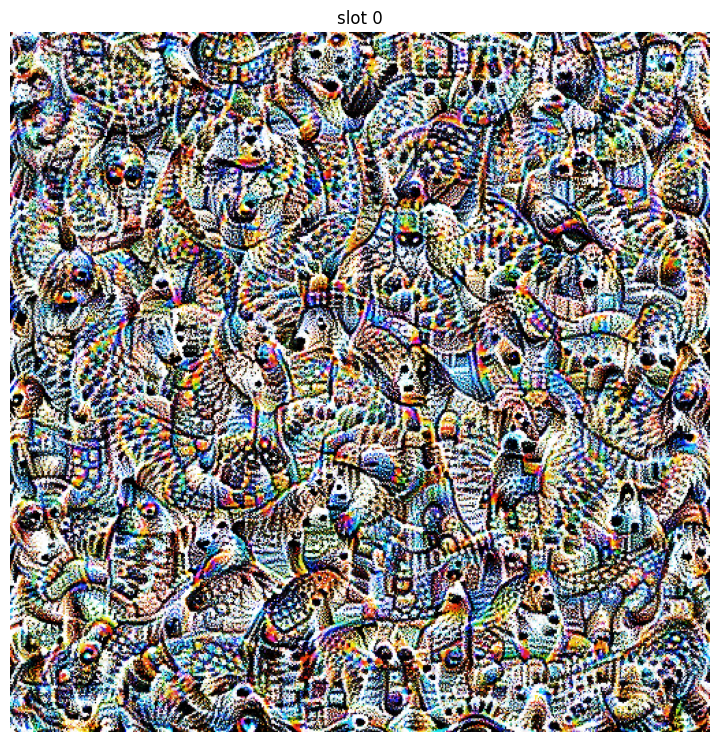

In [5]:
# Layer name
layer = 'conv_pw_12'

# Check activation maximization tutorial for more details
objective = Objective.layer(model = model, 
                            layer = layer)

images = run(objective = objective, parameterization = parameterization,
             steps = 1000, verbose = False, 
             learning_rate = 0.1)

plot_all(images)